Upload 2 file  training và test dataset lên đây

In [ ]:
from google.colab import files
files.upload()

Saving holdout_set_1e-4.txt to holdout_set_1e-4.txt
Saving training_set_1e-4.txt to training_set_1e-4.txt


{'holdout_set_1e-4.txt': b'RID rs111677930_G rs112900196_T rs10489961_T rs3125160_G rs12030051_G rs10753506_A rs2320590_C rs4654874_A rs4654878_G rs10799668_T rs10916876_T rs10916877_G rs10799669_T rs7515279_C rs10916879_G rs72652926_T rs10799670_T rs2305463_C rs4654879_G rs10916884_A rs6697488_T rs3890762_G rs4654881_T rs6704421_T rs6692553_C rs4654729_T rs10916900_G rs6692677_T rs12407731_T rs6698440_T rs9663017_G rs11580955_T rs114943260_T rs11205728_T rs10888693_G rs3789586_T rs7543272_C rs4655591_T rs10889589_G rs11585651_C rs12058296_A rs1338150_A rs11577982_C rs12080666_A rs6687769_C rs12072761_A rs10874177_C rs1338146_A rs6689197_A rs6670945_T rs1690543_C rs12135627_A rs236320_A rs77002349_G rs77342107_T rs74635631_A rs74123191_T rs16831953_G rs6663715_G rs6703887_C rs6695707_C rs57839241_G rs3766383_A rs2073653_C rs6686076_C rs6427572_A rs6427573_A rs1556260_T rs1556259_G rs58974723_A rs1974140_A rs6660240_C rs7516231_T rs111847432_A rs16832617_C rs11576830_C rs7525124_A rs465

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, RocCurveDisplay, ConfusionMatrixDisplay
)
import warnings
warnings.filterwarnings('ignore')

os.makedirs('plots', exist_ok=True)

df_train = pd.read_csv('training_set_1e-4.txt', sep=' ')
X_train_raw = df_train.drop(columns=['RID', 'Phenotype']).values
y_train = df_train['Phenotype'].values

feature_names = df_train.drop(columns=['RID', 'Phenotype']).columns.tolist()

print(f"X_train shape: {X_train_raw.shape}")
print(f"y_train shape: {y_train.shape}")


pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('log_reg', LogisticRegression(solver='saga', max_iter=1000, class_weight='balanced', random_state=42))
])

param_grid = {
   'log_reg__penalty': ['l1'], # Lasso
   'log_reg__C': [0.05,0.1,0.2,0.5,1,2,4],
}

cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=cv_strategy,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)
grid_search.fit(X_train_raw, y_train)

best_params = grid_search.best_params_
best_index = grid_search.best_index_

best_mean = grid_search.cv_results_['mean_test_score'][best_index]
best_std  = grid_search.cv_results_['std_test_score'][best_index]

print(f"{best_params}")

# read test file
df_test = pd.read_csv('holdout_set_1e-4.txt', sep=' ')
X_test_raw = df_test.drop(columns=['RID', 'Phenotype']).values
y_test = df_test['Phenotype'].values

best_pipeline = grid_search.best_estimator_

y_pred = best_pipeline.predict(X_test_raw)
y_pred_proba = best_pipeline.predict_proba(X_test_raw)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc = roc_auc_score(y_test, y_pred_proba)
cm = confusion_matrix(y_test, y_pred)

print(f"Accuracy:  {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall:    {rec:.4f}")
print(f"F1-Score:  {f1:.4f}")
print(f"ROC-AUC:   {roc:.4f}")
print(f"Confusion Matrix:\n{cm}")


best_log_reg = best_pipeline.named_steps['log_reg']
weights = best_log_reg.coef_[0]

feature_importance = pd.DataFrame({
    'Gene_Variant': feature_names,
    'Weight': weights,
    'Abs_Weight': np.abs(weights)
}).sort_values(by='Abs_Weight', ascending=False)


best_penalty = best_params['log_reg__penalty']
best_c = best_params['log_reg__C']
output_csv = f'Feature_Importance_{best_penalty}_c={best_c}.csv'
feature_importance.drop(columns=['Abs_Weight']).to_csv(output_csv, index=False)
print(f"Final weight saved to : {output_csv}")



BƯỚC 1: TIỀN XỬ LÝ DỮ LIỆU (DATA PREPROCESSING)
Kích thước tập X_train: (1000, 7476)
Kích thước tập y_train: (1000,)

BƯỚC 2 & 3: THIẾT LẬP PIPELINE VÀ LƯỚI SIÊU THAM SỐ
Không gian tham số: {'log_reg__penalty': ['l1'], 'log_reg__C': [0.1]}

BƯỚC 4: HUẤN LUYỆN VÀ TÌM KIẾM TỐI ƯU (GRID SEARCH)
Fitting 5 folds for each of 1 candidates, totalling 5 fits

=> Tham số tốt nhất: {'log_reg__C': 0.1, 'log_reg__penalty': 'l1'}
=> ROC-AUC tốt nhất trên tập Validation (Cross-Val): 0.6502 ± 0.0244

BƯỚC 6: ĐÁNH GIÁ TRÊN TẬP HOLD-OUT TEST
Accuracy:  0.5920
Precision: 0.6092
Recall:    0.5889
F1-Score:  0.5989
ROC-AUC:   0.6246
Confusion Matrix:
[[50 34]
 [37 53]]

BƯỚC 7: KHAI THÁC ĐẶC TRƯNG (FEATURE IMPORTANCE)
Top 10 Biến thể gen quan trọng nhất:
 Gene_Variant    Weight
   rs429358_C  0.777696
  rs7912495_G  0.221352
rs139136389_T  0.208099
 rs11129169_A  0.166755
 rs10964947_A  0.161876
  rs4355646_T  0.156630
 rs73039641_A -0.156616
 rs13125151_T -0.152253
 rs28751960_T -0.139236
  rs8056564_T -0

'\nprint("\n==========================================")\nprint("BƯỚC 8: TRỰC QUAN HÓA KẾT QUẢ ĐỂ BÁO CÁO")\nprint("==========================================")\n\n# 8.1. Vẽ Confusion Matrix\nplt.figure(figsize=(6, 5))\nConfusionMatrixDisplay.from_predictions(\n    y_test, y_pred,\n    display_labels=[\'Control\', \'Case\'],\n    cmap=\'Blues\', values_format=\'d\'\n)\nplt.title(\'Confusion Matrix\')\nplt.savefig(\'plots/confusion_matrix_lr_baseline.pdf\', dpi=300, bbox_inches=\'tight\')\nplt.close()\n\n# 8.2. Vẽ ROC Curve\nplt.figure(figsize=(7, 6))\nRocCurveDisplay.from_estimator(best_pipeline, X_test_raw, y_test, color=\'darkorange\')\nplt.plot([0, 1], [0, 1], color=\'navy\', linestyle=\'--\')\nplt.title(f\'ROC Curve\')\nplt.savefig(\'plots/roc_curve_lr_baseline.png\', dpi=300, bbox_inches=\'tight\')\nplt.close()\n\n# 8.3. Vẽ biểu đồ phân phối xác suất (Risk Score Distribution) [Cực kỳ quan trọng cho PRS]\nplt.figure(figsize=(8, 6))\nsns.kdeplot(y_pred_proba[y_test == 0], label=\'Co

<Figure size 600x500 with 0 Axes>

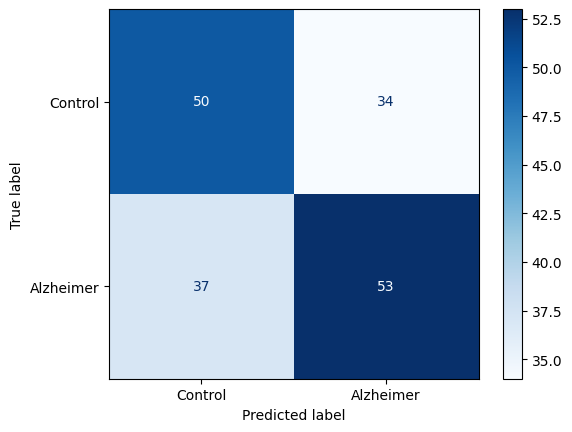

In [ ]:
# Confusion Matrix
plt.figure(figsize=(6, 5))
ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred,
    display_labels=['Control', 'Alzheimer'],
    cmap='Blues', values_format='d'
)
plt.savefig('plots/adni_1e-4_lasso_0.1_confusion_matrix.pdf', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 700x600 with 0 Axes>

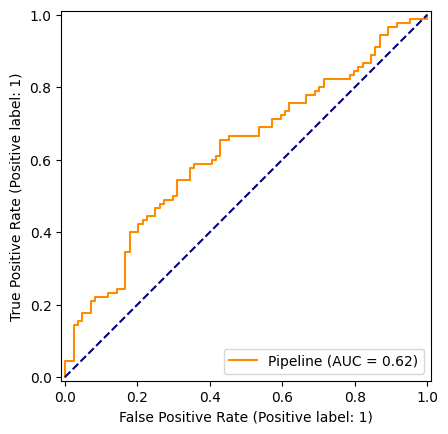

In [ ]:
# ROC Curve
plt.figure(figsize=(7, 6))
RocCurveDisplay.from_estimator(best_pipeline, X_test_raw, y_test, color='darkorange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.savefig('plots/adni_1e-4_lasso_0.1_roc_curve.pdf', dpi=300, bbox_inches='tight')
plt.show()

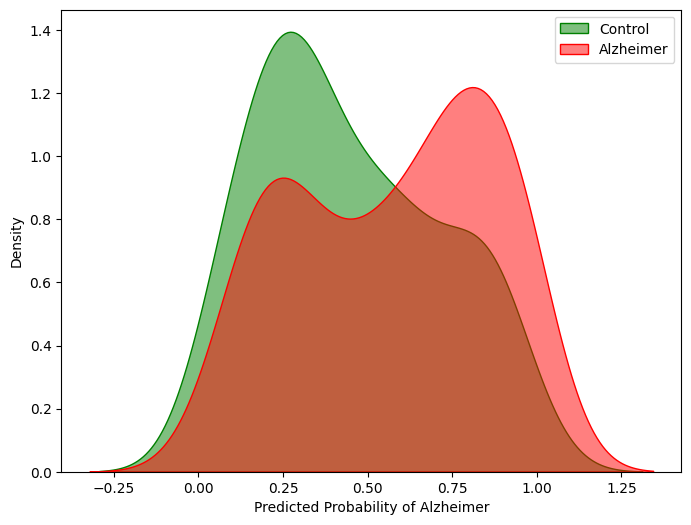

In [ ]:
# Risk Score Distribution
plt.figure(figsize=(8, 6))
sns.kdeplot(y_pred_proba[y_test == 0], label='Control', fill=True, color='green', alpha=0.5)
sns.kdeplot(y_pred_proba[y_test == 1], label='Alzheimer', fill=True, color='red', alpha=0.5)
plt.xlabel('Predicted Probability of Alzheimer')
plt.ylabel('Density')
plt.legend()
plt.savefig('plots/adni_1e-4_lasso_0.1_risk_score_distribution.pdf', dpi=300, bbox_inches='tight')
plt.show()

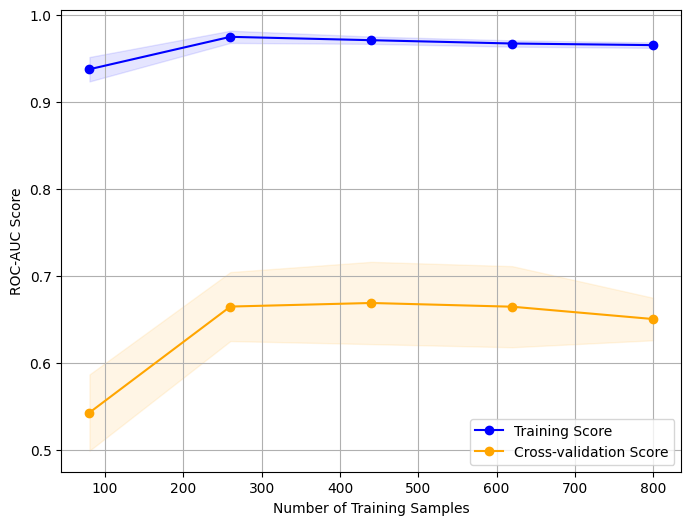

In [ ]:
"""
train_sizes, train_scores, test_scores = learning_curve(
    estimator=best_pipeline,
    X=X_train_raw,
    y=y_train,
    cv=cv_strategy,
    scoring='roc_auc',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5) # Lấy 5 mốc từ 10% đến 100% dữ liệu
)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.plot(train_sizes, test_mean, 'o-', color='orange', label='Cross-validation Score')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='orange')
plt.xlabel('Number of Training Samples')
plt.ylabel('ROC-AUC Score')
plt.legend(loc='best')
plt.grid(True)
plt.savefig('plots/adni_1e-8_lasso_0.05_learning_curve.pdf', dpi=300, bbox_inches='tight')
plt.show()
"""